# CSCI 8523 Fall 2022 - predicting global crop yields from MODIS
Tim Bodin, Maitrayee Deka, Varun Sethi, Josh Spitzer-Resnick

## resources

Data
- MODIS at 0.05' (up to 5.6km) https://lpdaac.usgs.gov/products/mod13c1v061/
  - CMG 0.05 Deg 16 days NDVI
  - CMG 0.05 Deg 16 days EVI
  - CMG 0.05 Deg 16 days red reflectance # band 1
  - CMG 0.05 Deg 16 days NIR reflectance # band 2, near infrared
  - CMG 0.05 Deg 16 days blue reflectance # band 3
  - CMG 0.05 Deg 16 days MIR reflectance # band 7, mid infrared
- MODIS at smaller granularity https://developers.google.com/earth-engine/datasets/catalog/modis
- MODIS land cover categories at 0.05' https://lpdaac.usgs.gov/news/modisterra-land-cover-types-yearly-l3-global-005deg-cmg-mod12c1/
  - MOD12C1 Land_Cover_Type_1 (IGBP/International Geosphere-Biosphere Programme)
    - Croplands (class 12)
    - Croplands/Natural Vegetation Mosaic (class 14)
  - MOD12C1 Land_Cover_Type_2 (UMD/University of Maryland)
    - Croplands (class 12)
- National Identifier Grid https://sedac.ciesin.columbia.edu/data/set/gpw-v4-national-identifier-grid-rev11/metadata
- CDL/Cropland Data Layer (only for US)

Documentation
- pyhdf
  - https://github.com/fhs/pyhdf/blob/master/pyhdf/SD.py
  - https://hdfeos.org/software/pyhdf.php
  - pandas.HDFStore https://pandas.pydata.org/docs/reference/api/pandas.HDFStore.select.html
- US state, county bounding boxes
  - https://anthonylouisdagostino.com/bounding-boxes-for-all-us-states/
  - state https://gist.github.com/a8dx/2340f9527af64f8ef8439366de981168
  - county https://gist.github.com/a8dx/7e550680f7ea6a68f20da00e21d7ce9b

Frameworks for DL
- Caffe http://caffe.berkeleyvision.org/
  - tutorial 1 https://docs.google.com/presentation/d/1UeKXVgRvvxg9OUdh_UiC5G71UMscNPlvArsWER41PsU/edit
  - tutorial 2 https://docs.google.com/presentation/d/1HxGdeq8MPktHaPb-rlmYYQ723iWzq9ur6Gjo71YiG0Y/edit
  - https://github.com/BVLC/caffe/blob/master/examples/00-classification.ipynb
  - https://github.com/BVLC/caffe/blob/master/examples/01-learning-lenet.ipynb
  - https://github.com/BVLC/caffe/blob/master/examples/02-fine-tuning.ipynb
- LSTM on Papers With Code https://paperswithcode.com/method/lstm
- LSTM vs GRU unit images https://en.wikipedia.org/wiki/Recurrent_neural_network
- Deep Learning framework history https://towardsdatascience.com/a-brief-history-of-deep-learning-frameworks-8debf3ba6607
  - Caffe2 became PyTorch
  - TensorFlow 2

## imports

In [ ]:
# installs
!pip install pyhdf

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 703 kB 14.7 MB/s 


In [ ]:
# imports
from google.colab import drive # drive.mount
import os # os.scandir
import pandas as pd
from pyhdf.SD import SD, SDC # scientific dataset # documentation https://github.com/fhs/pyhdf/blob/master/pyhdf/SD.py
from matplotlib import pyplot as plt
import numpy as np # np.linalg.norm

In [ ]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
for dir_entry in os.scandir('/content/drive/Shareddrives/CSCI 8523 F22'):
  print(dir_entry)

<DirEntry 'Exploratory data analysis.ipynb'>
<DirEntry 'Data'>
<DirEntry '2013209.hdf'>
<DirEntry 'CSCI 5527.gslides'>
<DirEntry 'Iowa NDVI Yield.gsheet'>
<DirEntry 'G1 Crop Yields - Bodin, Deka, Spitzer-Resnick.gslides'>
<DirEntry 'Literature review.gdoc'>


## bounding boxes

In [ ]:
# bounding boxes
# https://anthonylouisdagostino.com/bounding-boxes-for-all-us-states/
# state bounding boxes
# https://gist.github.com/a8dx/2340f9527af64f8ef8439366de981168
us_state_bounding_boxes_file = 'https://gist.githubusercontent.com/a8dx/2340f9527af64f8ef8439366de981168/raw/81d876daea10eab5c2675811c39bcd18a79a9212/US_State_Bounding_Boxes.csv'
# county bounding boxes
# https://gist.github.com/a8dx/7e550680f7ea6a68f20da00e21d7ce9b
us_county_bounding_boxes_file = 'https://gist.githubusercontent.com/a8dx/7e550680f7ea6a68f20da00e21d7ce9b/raw/5f88f425bb362f8e200456fb8181ecb0a8fd55d6/US_County_Boundingboxes.csv'

# bbIn
bounding_boxes_df = pd.read_csv(us_state_bounding_boxes_file)
bounding_boxes_df

,Unnamed: 0,STATEFP,STUSPS,NAME,xmin,ymin,xmax,ymax
0,1,1,AL,Alabama,-88.473227,30.223334,-84.889080,35.008028
1,2,2,AK,Alaska,-179.148909,51.214183,179.778470,71.365162
2,3,60,AS,American Samoa,-171.089874,-14.548699,-168.143300,-11.046934
3,4,4,AZ,Arizona,-114.816510,31.332177,-109.045223,37.004260
4,5,5,AR,Arkansas,-94.617919,33.004106,-89.644395,36.499600
5,6,6,CA,California,-124.409591,32.534156,-114.131211,42.009518
6,7,8,CO,Colorado,-109.060253,36.992426,-102.041524,41.003444
7,8,69,MP,Commonwealth of the Northern Mariana Islands,144.886331,14.110472,146.064818,20.553802
8,9,9,CT,Connecticut,-73.727775,40.980144,-71.786994,42.050587
9,10,10,DE,Delaware,-75.788658,38.451013,-75.048939,39.839007


In [ ]:
# bounding_boxes_df

iowa_bounding_box_df = bounding_boxes_df.loc[bounding_boxes_df['NAME'] == 'Iowa'].reset_index() # index 18
iowa_xmin = iowa_bounding_box_df.iloc[0]['xmin']
iowa_ymin = iowa_bounding_box_df.iloc[0]['ymin']
iowa_xmax = iowa_bounding_box_df.iloc[0]['xmax']
iowa_ymax = iowa_bounding_box_df.iloc[0]['ymax']

print('[xmin, xmax]', iowa_xmin, iowa_xmax) # longitude
print('[ymin, ymax]', iowa_ymin, iowa_ymax) # latidude

[xmin, xmax] -96.639704 -90.140061
[ymin, ymax] 40.375501 43.501196


In [ ]:
def get_state_bounding_box(bounding_boxes_df, state_name):
  bounding_box_df = bounding_boxes_df.loc[bounding_boxes_df['NAME'] == state_name].reset_index()
  xmin = bounding_box_df.iloc[0]['xmin']
  ymin = bounding_box_df.iloc[0]['ymin']
  xmax = bounding_box_df.iloc[0]['xmax']
  ymax = bounding_box_df.iloc[0]['ymax']
  return xmin, xmax, ymin, ymax

In [ ]:
get_state_bounding_box(bounding_boxes_df, 'Wisconsin')

(-92.888114, -86.805415, 42.491983, 47.080621)

In [ ]:
get_state_bounding_box(bounding_boxes_df, 'Minnesota')

(-97.239209, -89.491739, 43.499356, 49.384358)

In [ ]:
get_state_bounding_box(bounding_boxes_df, 'Iowa')

(-96.639704, -90.140061, 40.375501, 43.501196)

## translate x/longitude, y/latitude to pixels
- MODIS: 3600 (N/S) vs. 7200 (EW) pixel matrix
- x/longitude in [-180, 180]
  - (longitude + 180) / 360 = pixel / 7200
  - (longitude + 180) * 20 = pixel
- y/latitude in [-90, 90]
  - (latitude + 90) / 180 = pixel / 3600
  - (latitude + 90) * 20 = pixel



In [ ]:
xmin, xmax, ymin, ymax = get_state_bounding_box(bounding_boxes_df, 'Iowa')

def get_MODIS_pixels_from_lat_long(xmin, xmax, ymin, ymax):
  xmin_pixel = int( (xmin + 180) * 20 )
  xmax_pixel = int( (xmax + 180) * 20 )
  ymin_pixel = int( (ymin + 90) * 20 )
  ymax_pixel = int( (ymax + 90) * 20 )
  return xmin_pixel, xmax_pixel, ymin_pixel, ymax_pixel

In [ ]:
# Iowa
xmin_pixel, xmax_pixel, ymin_pixel, ymax_pixel = get_MODIS_pixels_from_lat_long( *get_state_bounding_box(bounding_boxes_df, 'California') ) # *() to unpack tuple
xmin_pixel, xmax_pixel, ymin_pixel, ymax_pixel

(1111, 1317, 2450, 2640)

In [ ]:
# jk, need to change the file addresses
# %run '20220419 process hdf v6.py'

FileNotFoundError: ignored

# try opening 1 hdf, explore

In [ ]:
data_file = '/content/drive/Shareddrives/CSCI 8523 F22/Data/MODIS-Aug_raw/2007209.hdf'

In [ ]:
# https://lpdaac.usgs.gov/products/mod13c1v061/
layer_options = [
  'CMG 0.05 Deg 16 days NDVI',
  'CMG 0.05 Deg 16 days EVI',
  # 'CMG 0.05 Deg 16 days VI Quality'
  'CMG 0.05 Deg 16 days red reflectance', # band 1
  'CMG 0.05 Deg 16 days NIR reflectance', # band 2, near infrared
  'CMG 0.05 Deg 16 days blue reflectance', # band 3
  'CMG 0.05 Deg 16 days MIR reflectance', # band 7, mid infrared
  # less useful:
  'CMG 0.05 Deg 16 days Avg sun zen angle',
  'CMG 0.05 Deg 16 days NDVI std dev',
  'CMG 0.05 Deg 16 days EVI std dev',  
  'CMG 0.05 Deg 16 days #1km pix used',
  'CMG 0.05 Deg 16 days #1km pix +-30deg VZ',
  # 'CMG 0.05 Deg 16 days pixel reliabilty',
]

fill_values = [
    -3000,
    -3000,
    # 65535,
    -1000,
    -1000,
    -1000,
    -1000,

    -10000,
    -3000,
    -3000,
    255,
    255,
    # -1
]

min_values = [
    -2000,
    -2000,
    # 0,
    0,
    0,
    0,
    0,

    0,
    -2000,
    -2000,
    0,
    0,
    # 0,
]

max_values = [
    10000,
    10000,
    # 65534,
    10000,
    10000,
    10000,
    10000,

    18000,
    10000,
    10000,
    36,
    36,
    # 4
]

In [ ]:
hdf = SD(data_file, SDC.READ)

hdf.attributes()
hdf.datasets() # useful # select regions by (ydim, xdim)
# hdf.info() # 13 datasets, 6 ?

{'CMG 0.05 Deg 16 days NDVI': (('YDim:MODIS_Grid_16Day_VI_CMG',
   'XDim:MODIS_Grid_16Day_VI_CMG'),
  (3600, 7200),
  22,
  0),
 'CMG 0.05 Deg 16 days EVI': (('YDim:MODIS_Grid_16Day_VI_CMG',
   'XDim:MODIS_Grid_16Day_VI_CMG'),
  (3600, 7200),
  22,
  1),
 'CMG 0.05 Deg 16 days VI Quality': (('YDim:MODIS_Grid_16Day_VI_CMG',
   'XDim:MODIS_Grid_16Day_VI_CMG'),
  (3600, 7200),
  23,
  2),
 'CMG 0.05 Deg 16 days red reflectance': (('YDim:MODIS_Grid_16Day_VI_CMG',
   'XDim:MODIS_Grid_16Day_VI_CMG'),
  (3600, 7200),
  22,
  3),
 'CMG 0.05 Deg 16 days NIR reflectance': (('YDim:MODIS_Grid_16Day_VI_CMG',
   'XDim:MODIS_Grid_16Day_VI_CMG'),
  (3600, 7200),
  22,
  4),
 'CMG 0.05 Deg 16 days blue reflectance': (('YDim:MODIS_Grid_16Day_VI_CMG',
   'XDim:MODIS_Grid_16Day_VI_CMG'),
  (3600, 7200),
  22,
  5),
 'CMG 0.05 Deg 16 days MIR reflectance': (('YDim:MODIS_Grid_16Day_VI_CMG',
   'XDim:MODIS_Grid_16Day_VI_CMG'),
  (3600, 7200),
  22,
  6),
 'CMG 0.05 Deg 16 days Avg sun zen angle': (('YDim:MOD

In [ ]:
hdf # pyhdf.SD.SD
layer_options[0] # CMG 0.05 Deg 16 days NDVI

hdf.select(layer_options[0]) # pyhdf.SD.SDS

In [ ]:
plt.rcParams["figure.figsize"] = (20,10)
# plt.rcParams["figure.figsize"] = plt.rcParamsDefault["figure.figsize"]

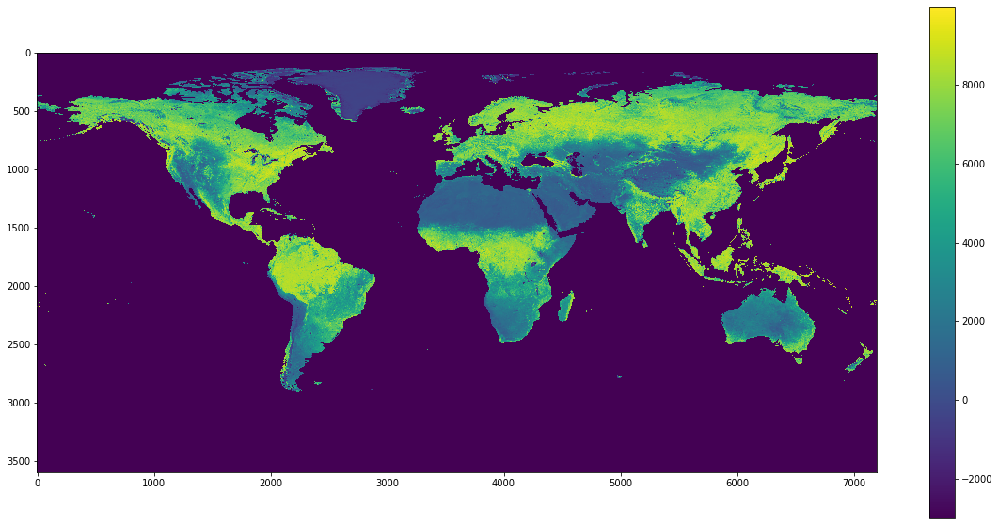

In [ ]:
data = hdf.select(layer_options[0]) # [ymin_pixel:ymax_pixel, xmin_pixel:xmax_pixel]

plt.imshow(data, interpolation='nearest')
plt.colorbar()
plt.show()

# data[ymin_pixel:ymax_pixel, xmin_pixel:xmax_pixel]

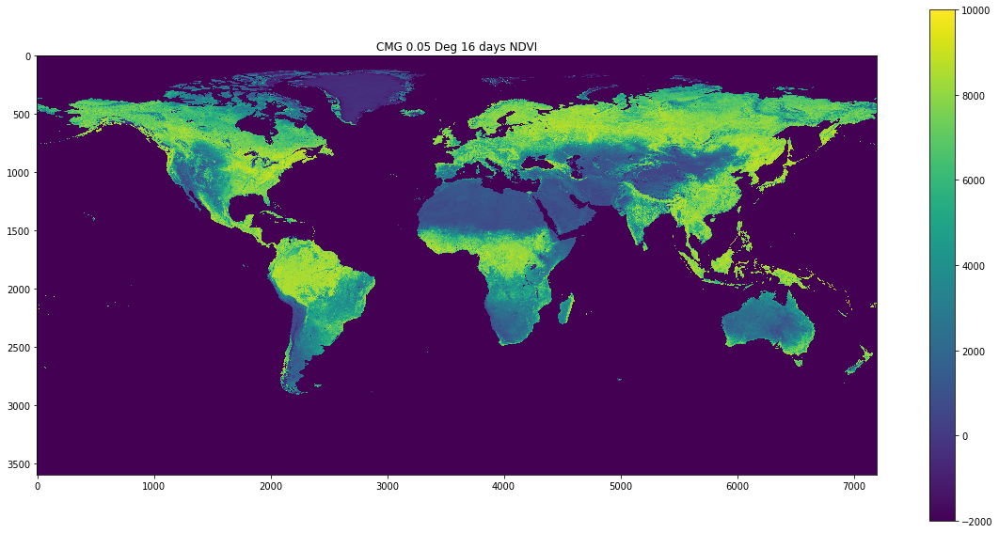

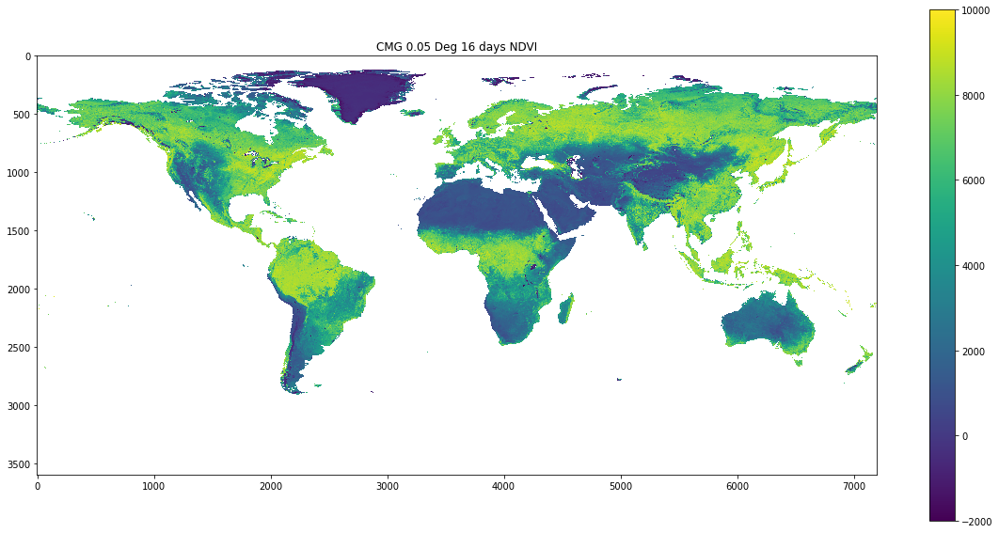

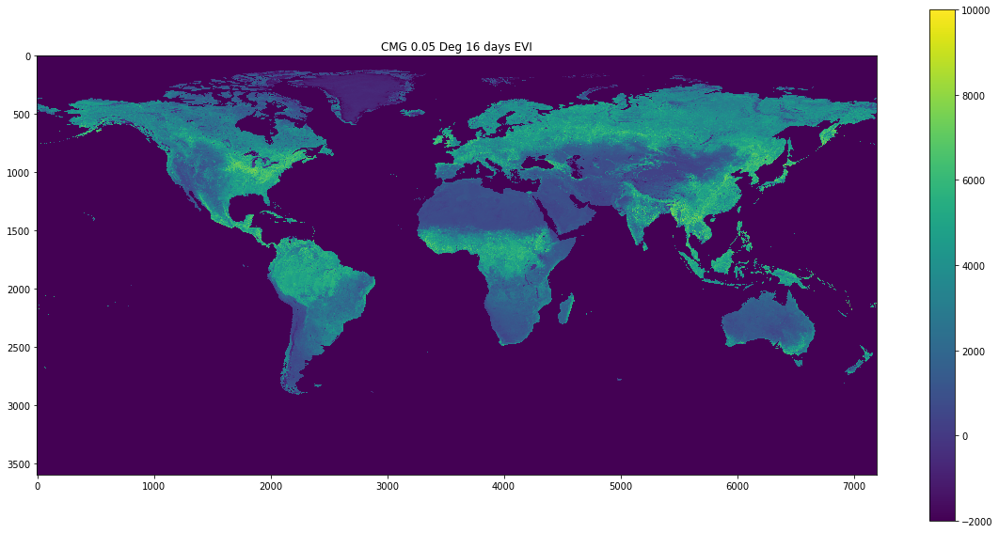

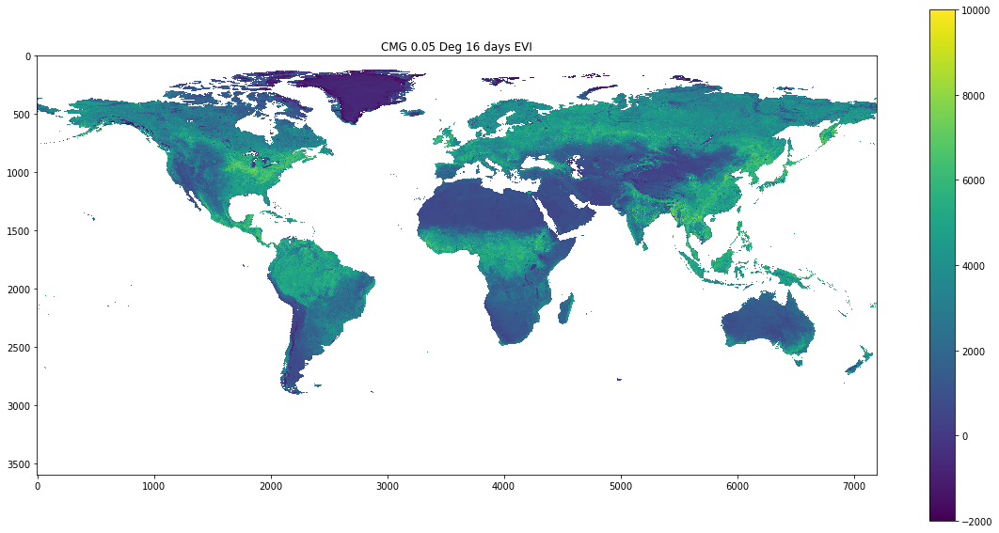

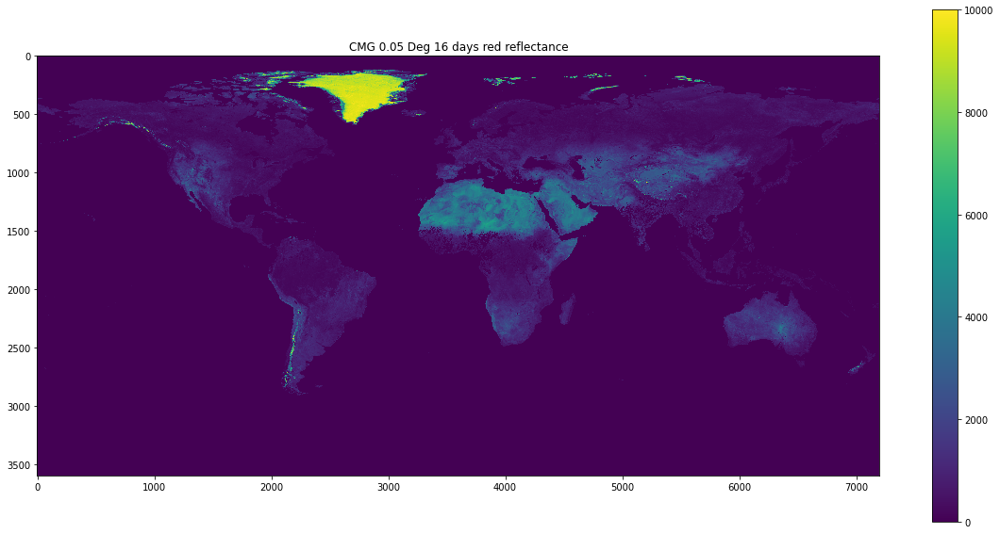

...

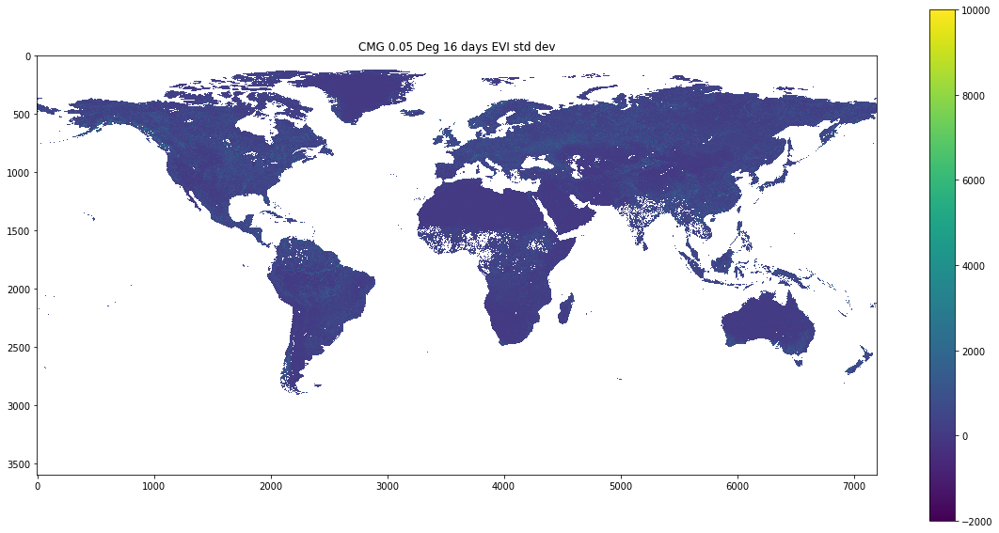

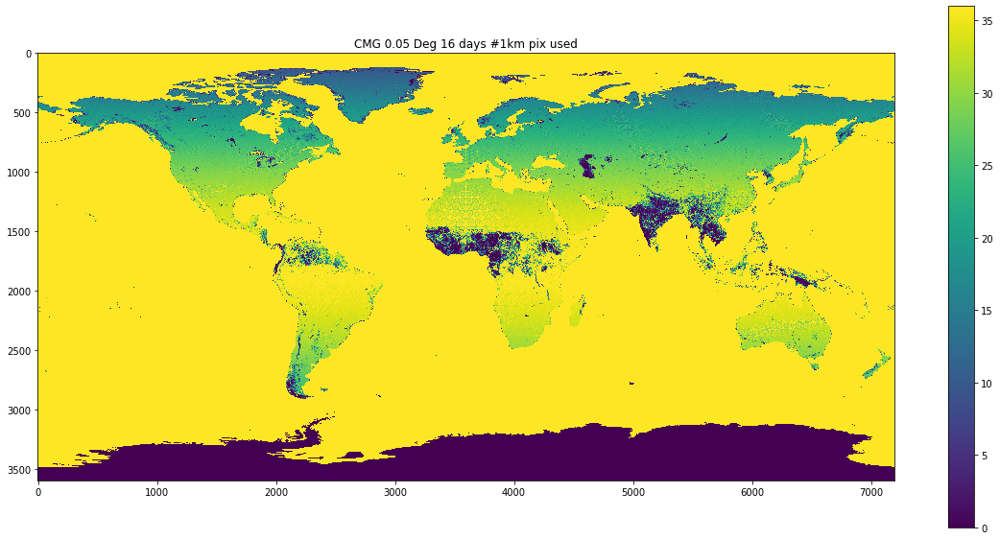

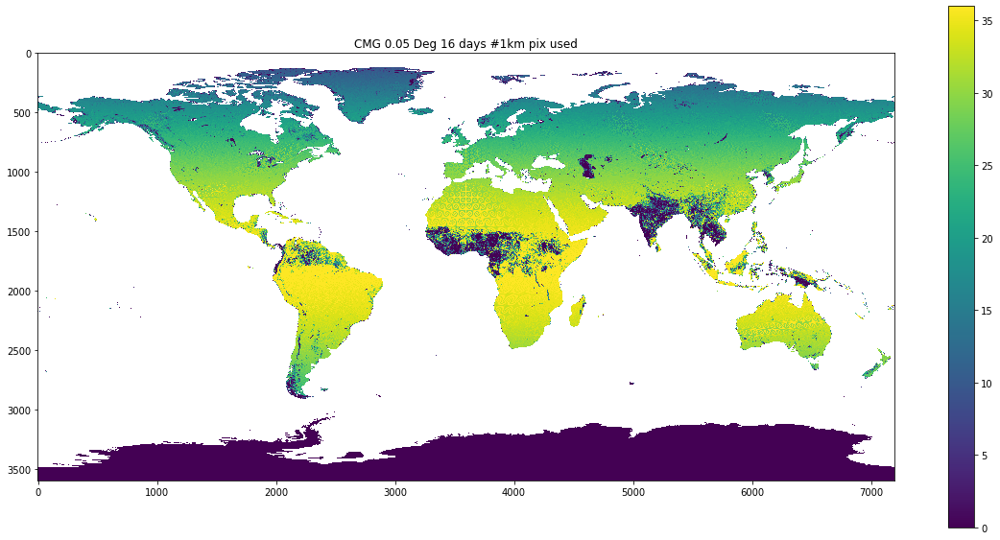

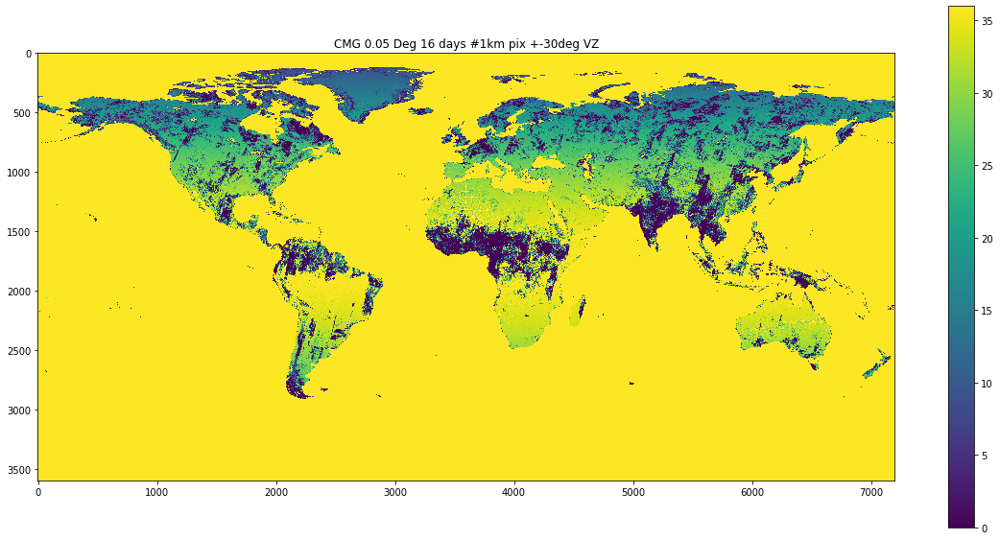

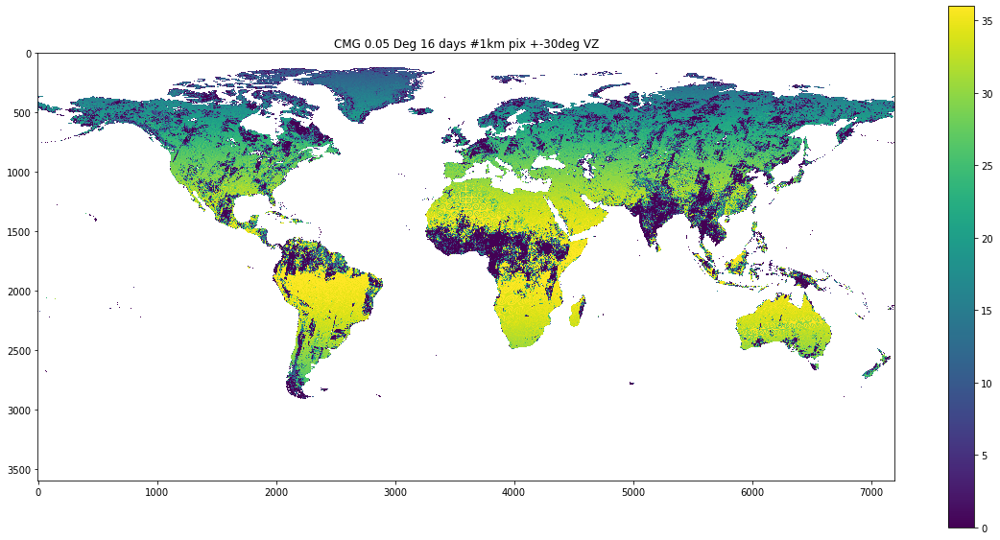

In [ ]:
for (layer, fill, min, max) in zip(layer_options, fill_values, min_values, max_values):
  data = hdf.select(layer)
  plt.imshow(data, interpolation='nearest', vmin=min, vmax=max)
  plt.title(layer)
  plt.colorbar()
  plt.show()

  data_masked = np.ma.masked_where(data[:] == fill, data[:])
  plt.imshow(data_masked, interpolation='nearest', vmin=min, vmax=max)
  plt.title(layer)
  plt.colorbar()
  plt.show()

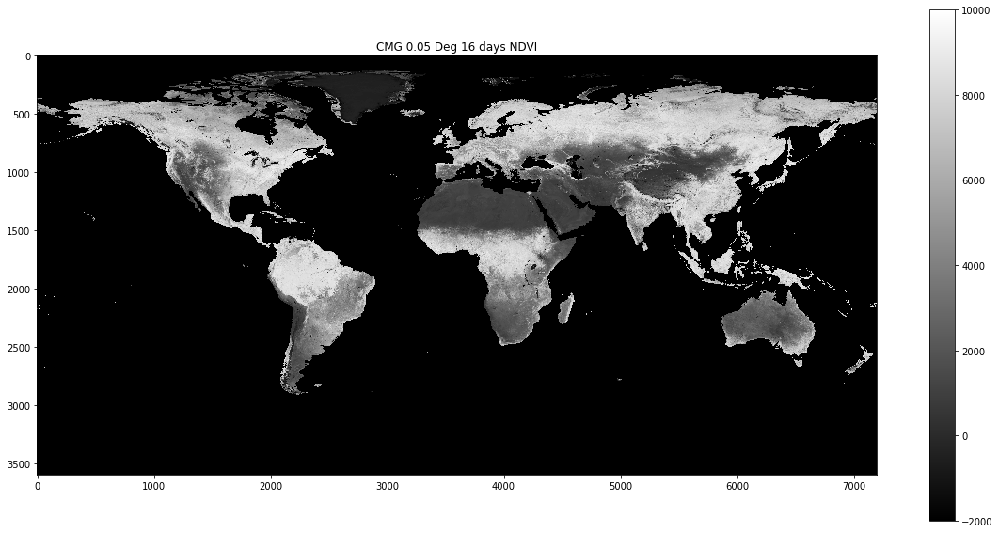

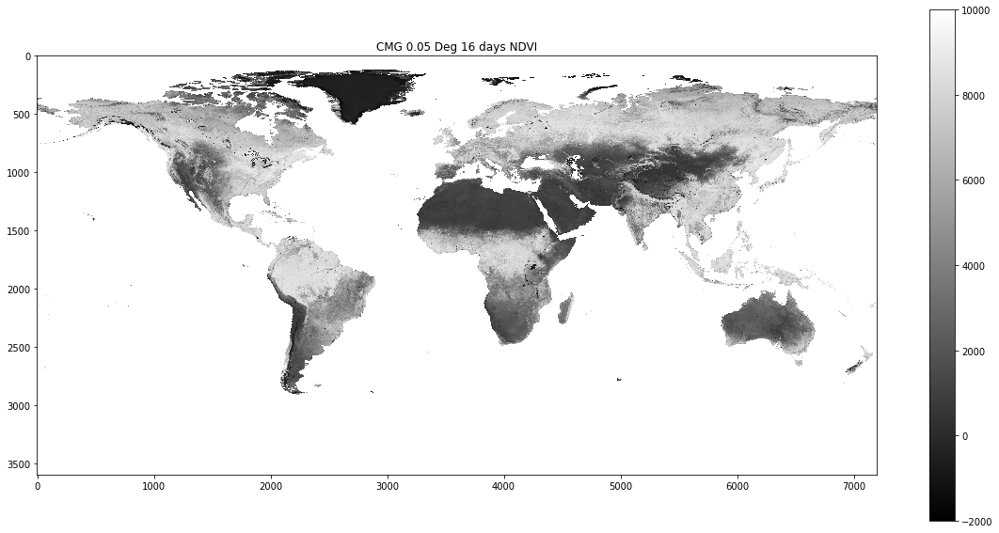

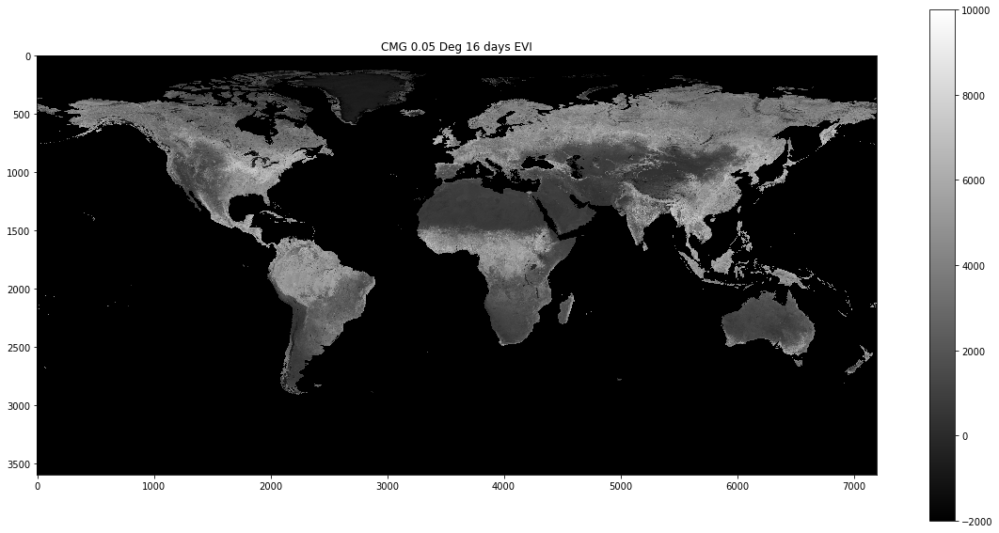

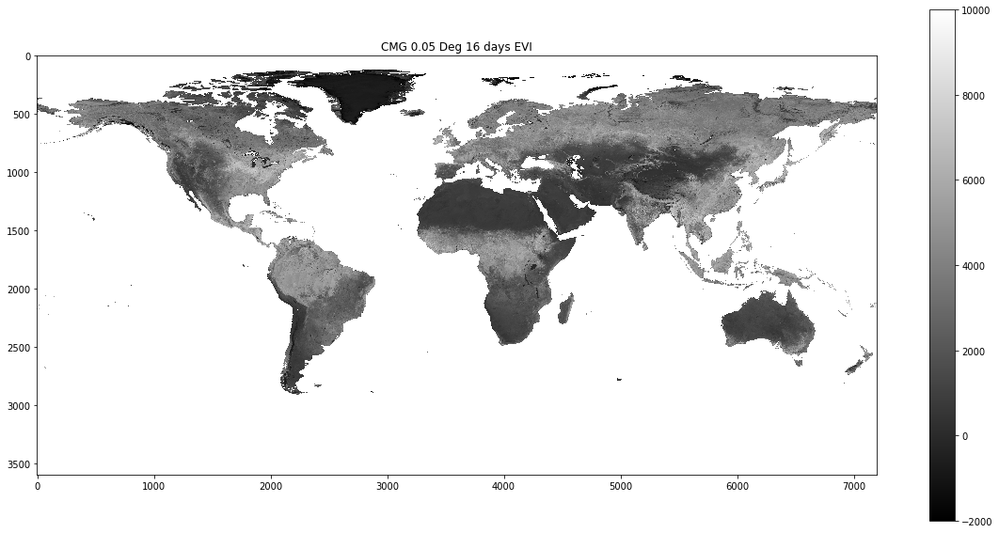

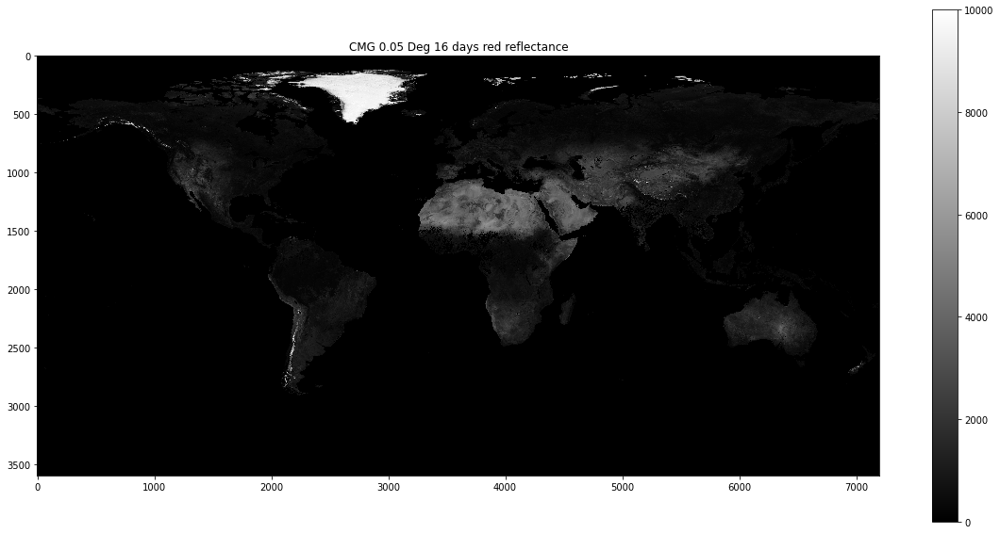

...

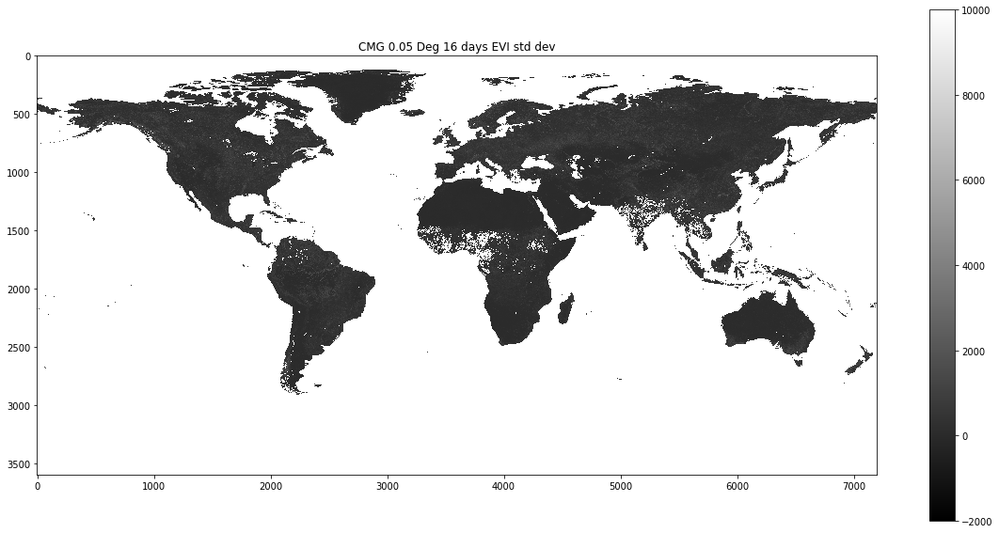

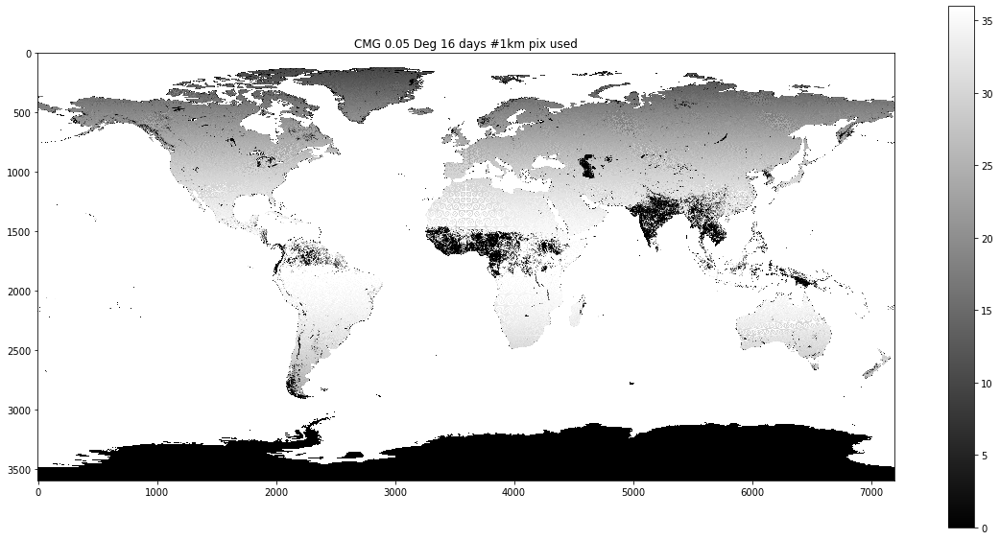

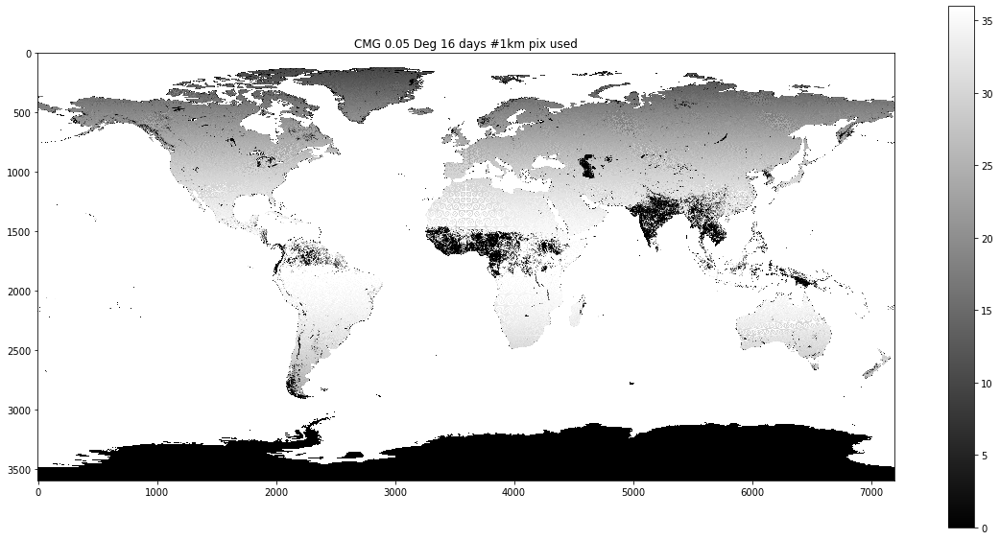

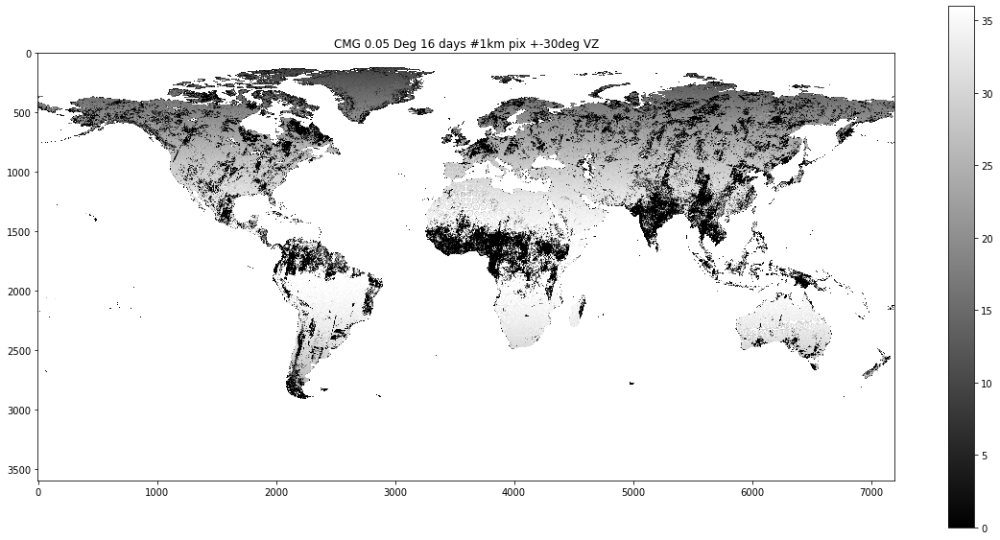

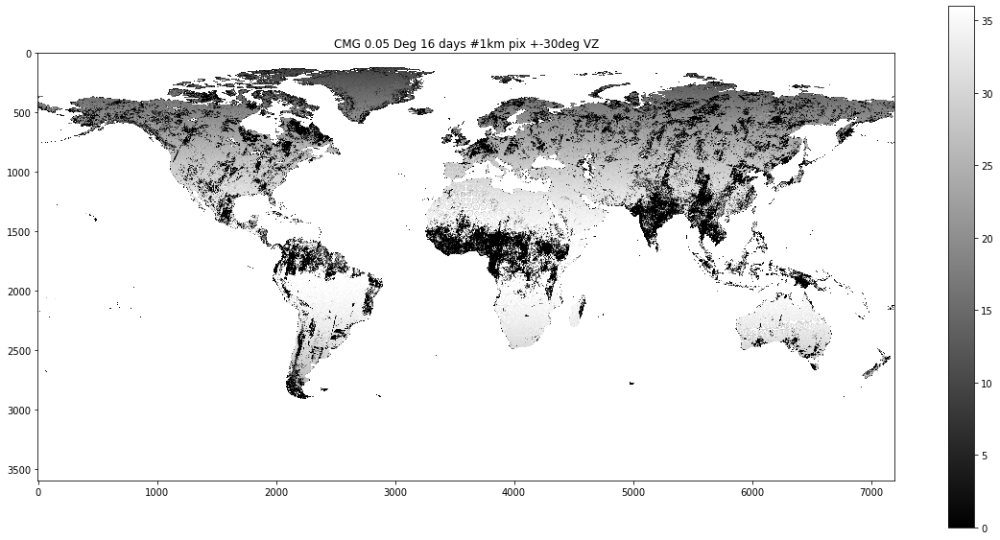

In [ ]:
for (layer, fill, min, max) in zip(layer_options, fill_values, min_values, max_values):
  data = hdf.select(layer)
  plt.imshow(data, interpolation='nearest', vmin=min, vmax=max, cmap = 'gray')
  plt.title(layer)
  plt.colorbar()
  plt.show()

  data_masked = np.ma.masked_where(data[:] == fill, data[:])
  plt.imshow(data_masked, interpolation='nearest', vmin=min, vmax=max, cmap = 'gray')
  plt.title(layer)
  plt.colorbar()
  plt.show()

In [ ]:
data_test = data[:].astype(float)

data_test -= np.mean(data[:])  # .astype(int16)
data_test /= np.std(data[:])
# data_test -= np.linalg.norm(data[:])

data_test

array([[-0.52125499, -0.52125499, -0.52125499, ..., -0.52125499,
        -0.52125499, -0.52125499],
       [-0.52125499, -0.52125499, -0.52125499, ..., -0.52125499,
        -0.52125499, -0.52125499],
       [-0.52125499, -0.52125499, -0.52125499, ..., -0.52125499,
        -0.52125499, -0.52125499],
       ...,
       [-0.52125499, -0.52125499, -0.52125499, ..., -0.52125499,
        -0.52125499, -0.52125499],
       [-0.52125499, -0.52125499, -0.52125499, ..., -0.52125499,
        -0.52125499, -0.52125499],
       [-0.52125499, -0.52125499, -0.52125499, ..., -0.52125499,
        -0.52125499, -0.52125499]])

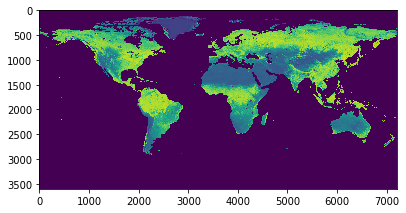

In [ ]:
plt.imshow(data_test, interpolation='nearest')
plt.show()

# data[ymin_pixel:ymax_pixel, xmin_pixel:xmax_pixel]

In [ ]:
data_masked = np.ma.masked_where(data[:] == -3000, data[:])
data_masked

masked_array(
  data=[[--, --, --, ..., --, --, --],
        [--, --, --, ..., --, --, --],
        [--, --, --, ..., --, --, --],
        ...,
        [--, --, --, ..., --, --, --],
        [--, --, --, ..., --, --, --],
        [--, --, --, ..., --, --, --]],
  mask=[[ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        ...,
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True]],
  fill_value=999999,
  dtype=int16)

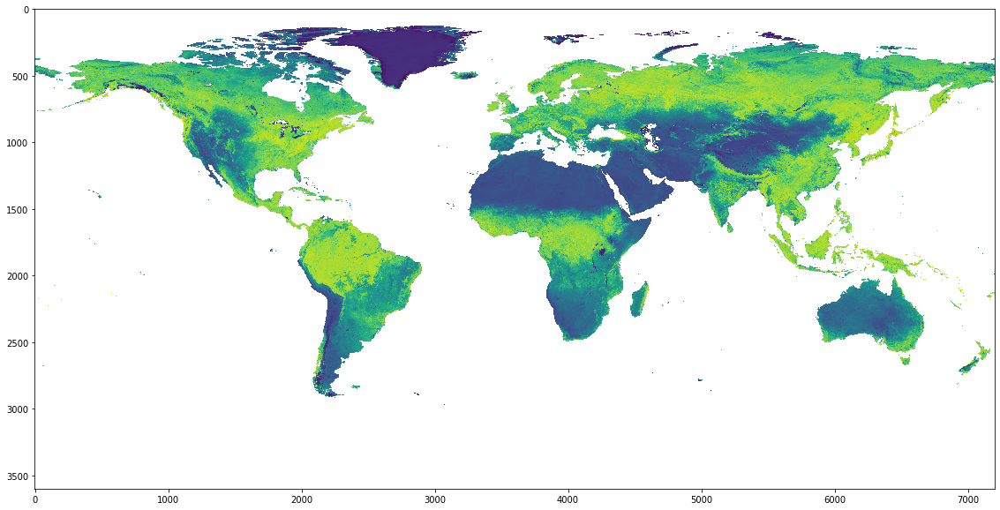

In [ ]:
plt.imshow(data_masked, interpolation='nearest')
plt.show()

# data[ymin_pixel:ymax_pixel, xmin_pixel:xmax_pixel]

## iterating through hdf

In [ ]:
for YYYY000 in range(2000000,2023000,1000):
  YYYY=YYYY000/1000
  print(YYYY)

2000.0
2001.0
2002.0
2003.0
2004.0
2005.0
2006.0
2007.0
2008.0
2009.0
2010.0
2011.0
2012.0
2013.0
2014.0
2015.0
2016.0
2017.0
2018.0
2019.0
2020.0
2021.0
2022.0


In [ ]:
for DDD in range(1,369,16):
  YYYYDDD = YYYY000+DDD
  print(DDD)

1
17
33
49
65
81
97
113
129
145
161
177
193
209
225
241
257
273
289
305
321
337
353


## EDA

# visualize

In [ ]:
# numpy array
# US dimension (315 x 1150 x 520 tim periods) - more than half not useful, winter
#